In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
sns.set()
df = pd.read_pickle('female_test.pkl')
import os
import pickle
from glob import glob
from scipy.stats import pearsonr
from scipy.stats import gaussian_kde
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet, ElasticNetCV
from datetime import datetime

In [2]:
np.square(df.iloc[0].dataframe.age_delta_decon).mean()

9.162102301707414

# Info Sources:

https://www.youtube.com/watch?v=WwBeKMQ0-I8&t=672s
https://www.youtube.com/watch?v=MREiHgHgl0k

https://interpret.ml/docs/ebm.html

https://dl.acm.org/doi/pdf/10.1145/2487575.2487579
https://dl.acm.org/doi/pdf/10.1145/2339530.2339556
https://www.microsoft.com/en-us/research/wp-content/uploads/2017/06/KDD2015FinalDraftIntelligibleModels4HealthCare_igt143e-caruanaA.pdf


https://github.com/interpretml/interpret/blob/develop/examples/python/notebooks/Interpretable%20Regression%20Methods.ipynb

https://github.com/interpretml/interpret/blob/develop/examples/python/notebooks/Explaining%20Blackbox%20Regressors.ipynb

https://github.com/interpretml/interpret/blob/develop/examples/python/notebooks/Merging%20EBM%20Models.ipynb

https://towardsdatascience.com/interpretml-another-way-to-explain-your-model-b7faf0a384f8

https://arxiv.org/pdf/1909.09223.pdf

https://towardsdatascience.com/the-explainable-boosting-machine-f24152509ebb



https://medium.com/analytics-vidhya/explain-your-model-with-microsofts-interpretml-5daab1d693b4

https://coderzcolumn.com/tutorials/machine-learning/interpret-ml-explain-machine-learning-models-and-their-predictions



In [3]:
def scatter_plot_heatmap(x, y, xlabel, ylabel, title, equality_line=True, set_scale=False):
    
    if isinstance(x, pd.Series):
        x = x.to_numpy()
    
    if isinstance(y, pd.Series):
        y = y.to_numpy()
    
    fig = plt.figure(figsize=[7.2, 7.2])
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z,s=50)
    if equality_line == True:
        plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
    
    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    
    pearson_correlation = pearsonr(x,y)[0]
    
    if set_scale == True:
        x_min, x_max = np.min(x), np.max(x)
        y_min, y_max = np.min(y), np.max(y)
        c_min, c_max = min(x_min, y_min), max(x_max, y_max)
        plt.xlim([c_min-2, c_max+2])
        plt.ylim([c_min-2, c_max+2])
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    lbl = 'Pearson R = '+str(round(pearson_correlation,3))
    plt.plot([],[],' ',label=lbl)
    
    plt.title(title)
    plt.legend()
    plt.show()
    
def kde_plot(x, y, xlabel, ylabel, title):
    plt.figure()
    sns.kdeplot(x, label='Ground Truth')
    sns.kdeplot(y, label= ylabel)
    plt.legend()
    plt.title(title)
    
def age_deconfounding(predicted_ages, chronological_ages):
    
    if isinstance(predicted_ages, pd.Series):
        predicted_ages = predicted_ages.to_numpy()
    
    if isinstance(chronological_ages, pd.Series):
        chronological_ages = chronological_ages.to_numpy()
    
    ones = np.ones(len(chronological_ages))
    chronological_ages_squared = np.square(chronological_ages)
    chronological_ages_confounds = np.array([ones, chronological_ages])
    
    ones_predicted = np.ones(len(predicted_ages))
    predicted_ages_squared = np.square(predicted_ages)
    predicted_ages_confounds = np.array([ones_predicted, predicted_ages])
    
    predicted_ages = np.reshape(predicted_ages, (len(predicted_ages), 1) )
    beta = np.dot( np.linalg.pinv(chronological_ages_confounds.T), predicted_ages )

    corrected_predicted_ages = (predicted_ages.flatten() - beta[0])/beta[1]
    
    return corrected_predicted_ages

In [4]:
from sklearn.model_selection import train_test_split

df_test = {}
df_test['Unnamed: 0'] = df.iloc[0].dataframe['Unnamed: 0'].to_list()
for idx in range(len(df)):
    name = df.iloc[idx].modality
    data = df.iloc[idx].dataframe.mean_output_age.to_list()
    df_test[name] = data
    
df_test = pd.DataFrame.from_dict(df_test)
df_test['target_age'] = df.iloc[0].dataframe.target_age.to_list()

df_testA, df_testB = train_test_split(df_test, test_size=0.5, random_state=1)
subjects_testA = df_testA['Unnamed: 0'].to_list()
subjects_testB = df_testB['Unnamed: 0'].to_list()
df_testA = df_testA.drop(labels='Unnamed: 0', axis=1)
df_testB = df_testB.drop(labels='Unnamed: 0', axis=1)

df_train = df_testA
df_test = df_testB

In [5]:
Xtrain = df_train.loc[:, df_train.columns != 'target_age']
Ytrain = df_train['target_age']

Xtest = df_test.loc[:, df_test.columns != 'target_age']
Ytest = df_test['target_age']

In [6]:
# Xtrain = Xtrain.to_numpy()
# Ytrain = Ytrain.to_numpy()
# Xtest = Xtest.to_numpy()
# Ytest = Ytest.to_numpy()

In [7]:
print(Xtrain.shape, Ytrain.shape)
print(Xtest.shape, Ytest.shape)

(2511, 57) (2511,)
(2511, 57) (2511,)


# EBM Fun starts here

In [8]:
# pip install interpret

In [9]:
from interpret import show
from interpret.data import Marginal

marginal = Marginal().explain_data(Xtrain, Ytrain, name = 'Train Data')
show(marginal)

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/interpret/visual/udash.py:5: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/interpret/visual/udash.py:6: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/interpret/visual/udash.py:7: UserWarning: 
The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`
  import dash_table as dt


<!-- http://127.0.0.1:7001/4530703760/ -->

This allows us to check a Summary of our data, which shows a histogram of targets, as well as scatter plots and pearson correlations between each input metric and the target data.

In [10]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split

from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show

In [12]:
Xtrain.head()

,T1_nonlinear,T1_linear,jacobian,vbm,T2_nonlinear,T2_lesions,swi,rsfmri_0,rsfmri_1,rsfmri_2,...,tbss_OD_s,tbss_FA,tbss_ICVF,tbss_ISOVF,tbss_L1,tbss_L2,tbss_L3,tbss_MD,tbss_MO,tbss_OD
2820,66.709417,67.442993,61.093726,62.254519,69.164342,63.855006,67.249040,58.140988,62.120589,64.160736,...,62.374906,62.182788,61.906055,63.804283,61.755967,58.793064,62.017001,62.214266,65.457215,64.070314
1708,60.944236,61.842161,58.154415,63.287874,59.937619,60.383603,64.117655,57.543353,54.386728,55.125870,...,61.829482,59.943876,59.250686,62.674294,59.842834,60.130049,60.041532,60.133045,58.552697,60.884393
3530,69.986284,70.044437,67.995620,68.787147,66.860631,63.243362,65.436874,67.694233,64.469723,67.990499,...,71.638821,69.095557,68.243078,70.294473,71.528098,68.952060,68.205580,68.265059,67.692567,71.046120
3480,50.189046,49.536327,55.061271,52.386892,51.970549,55.862569,54.179867,54.311277,60.954406,58.720743,...,53.015953,52.460709,51.984690,52.651951,51.896004,51.796198,53.048449,51.241098,53.523593,52.749642
670,71.524370,74.981445,69.319275,72.855853,68.487738,74.630128,70.888287,67.358183,62.182683,68.813820,...,72.819603,69.198738,68.378360,69.722930,69.319782,69.967300,67.481915,68.142391,68.747928,68.246657


In [13]:
ebm = ExplainableBoostingRegressor()

In [14]:
ebm.fit(Xtrain, Ytrain)

ExplainableBoostingRegressor(feature_names=['T1_nonlinear', 'T1_linear',
                                            'jacobian', 'vbm', 'T2_nonlinear',
                                            'T2_lesions', 'swi', 'rsfmri_0',
                                            'rsfmri_1', 'rsfmri_2', 'rsfmri_3',
                                            'rsfmri_4', 'rsfmri_5', 'rsfmri_6',
                                            'rsfmri_7', 'rsfmri_8', 'rsfmri_9',
                                            'rsfmri_10', 'rsfmri_11',
                                            'rsfmri_12', 'rsfmri_13',
                                            'rsfmri_14', 'rsfmri_15',
                                            'rsfmri_16', 'rsfmri_17',
                                            'rsfmri_18', 'rsfmri_19...
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                    

## Evaluate EBM performance

RegressionPerf shows the performance of the model on the test data, including the RMSE and R2 + the residuals

In [15]:
from interpret.perf import RegressionPerf
ebm_perf = RegressionPerf(ebm.predict).explain_perf(Xtest, Ytest, name='EBM')
show(ebm_perf)

MAE= 2.095530250686509
PR= 0.9326734944104261
MAE Decon= 2.2297290834860495
PR Decon= 0.9326734944104261


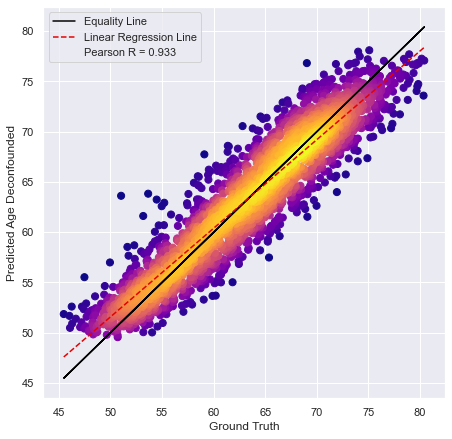

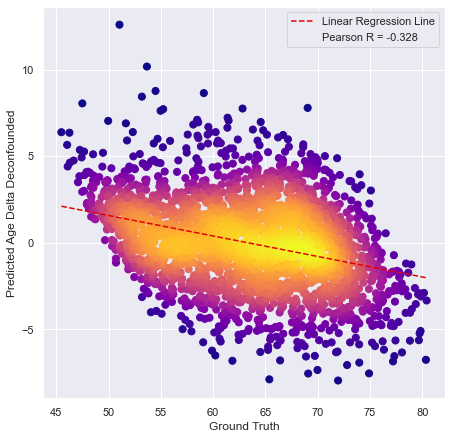

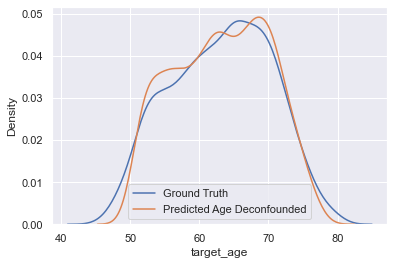

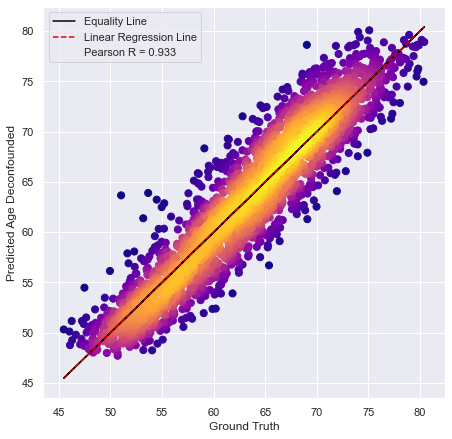

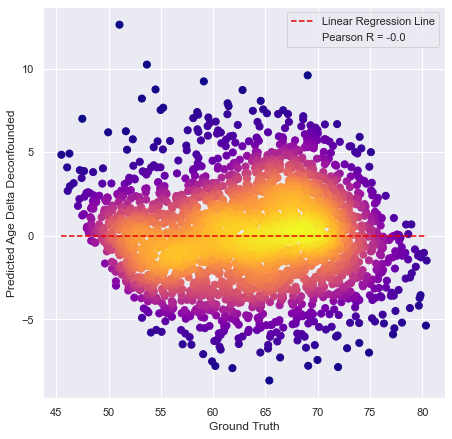

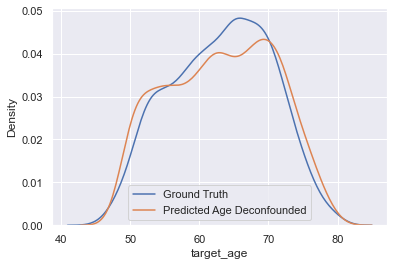

In [16]:
Yhat = ebm.predict(Xtest)

deconfound = True
verbose = True
show_plots = True

Age_Deltas = Yhat - Ytest

if deconfound == True:
    Yhat_decon = age_deconfounding(Yhat, Ytest)
    Age_Deltas_decon = Yhat_decon - Ytest
else:
    Yhat_decon = None
    Age_Deltas_decon = None
    
mae = np.abs(Age_Deltas).mean()
pr = pearsonr(Ytest, Yhat)[0]

if deconfound == True:
    mae_decon = np.abs(Age_Deltas_decon).mean()
    pr_decon = pearsonr(Ytest, Yhat_decon)[0]
else:
    mae_decon = None
    pr_decon = None

if verbose == True:
    print('MAE=', mae)
    print('PR=', pr)
#     print('Time To Complete: {}'.format(end_time - start_time))
    if deconfound == True:
        print('MAE Decon=', mae_decon)
        print('PR Decon=', pr_decon)

if show_plots == True:
    scatter_plot_heatmap(x=Ytest, y=Yhat, xlabel='Ground Truth', 
                           ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

    scatter_plot_heatmap(x=Ytest, y=Age_Deltas, xlabel='Ground Truth', 
                           ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                           equality_line=False)

    kde_plot(x=Ytest, y=Yhat, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)

    if deconfound == True:
        scatter_plot_heatmap(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

        scatter_plot_heatmap(x=Ytest, y=Age_Deltas_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                               equality_line=False)

        kde_plot(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)          

In [17]:
# df_output = pd.DataFrame.from_dict({
#     'modality': 'EBM',
#     'dataframe': [pd.DataFrame.from_dict({
#             'Unnamed: 0': subjects_testB,
#             'age_delta_decon': Age_Deltas_decon
#             })]
#     })

# output_name = 'male_ensembles_testset.pkl'

# if os.path.exists(output_name):
#     df_ensambles = pd.read_pickle(output_name)
#     if df_output.iloc[0].modality in df_ensambles.modality.to_list():
#         pass
#     else:
#         df_ensambles = pd.concat([df_ensambles, df_output])
#         df_ensambles.to_pickle(output_name, protocol = 4)
# else:
#     df_output.to_pickle(output_name, protocol = 4)
    
# df_ensambles = pd.read_pickle(output_name)
# df_ensambles

## Global Explanations: What the model learned overall

This tells us what the model leanrs for the whole data. The summary tab shows the overall variable imporatance ranked in descending order. For individual values, the PDP (Partial Dependence Plot) shows the marginal effect of the feature on the predicted outcome of the model, while the histogram indicates the distribution of that value.

In [18]:
ebm_global = ebm.explain_global(name='EBM')
show(ebm_global)

## Local Explanations: How an individual prediction was made

For each of the predictions, this shows us the contributions of all variables for this recod, ranked in descending order + the intercept (which looks like the mean age). The +/- indicates if the contribution is +ve or -ve. As EBM is a GAM model, the prediction is the sum of all the coefficients. 

In [19]:
ebm_local = ebm.explain_local(Xtest[:5], Ytest[:5], name='EBM')
print(Ytest[:5])
show(ebm_local)

4782    59.311073
1499    67.523907
1355    72.236872
428     69.261758
4145    48.488699
Name: target_age, dtype: float64


In [20]:
from interpret import show
from interpret.perf import RegressionPerf

ebm_perf = RegressionPerf(ebm.predict).explain_perf(Xtest, Ytest, name='EBM')
show(ebm_perf)

# Let's test out a few other Explainable Models

In [21]:
from interpret.glassbox import LinearRegression, RegressionTree

seed = 1

lr = LinearRegression(random_state=seed)
lr.fit(Xtrain, Ytrain)

rt = RegressionTree(random_state=seed)
rt.fit(Xtrain, Ytrain)

lr_perf = RegressionPerf(lr.predict).explain_perf(Xtest, Ytest, name='Linear Regression')
rt_perf = RegressionPerf(rt.predict).explain_perf(Xtest, Ytest, name='Regression Tree')

show(lr_perf)
show(rt_perf)
show(ebm_perf)

In [22]:
lr_global = lr.explain_global(name='Linear Regression')
rt_global = rt.explain_global(name='Regression Tree')

show(lr_global)
show(rt_global)
show(ebm_global)

In [23]:
lr_local = lr.explain_local(Xtest[:5], Ytest[:5], name='Linear Regression')
rt_local = rt.explain_local(Xtest[:5], Ytest[:5], name='Regression Tree')

show(lr_local)
show(rt_local)
show(ebm_local)

In [24]:
# Do everything in one shot with the InterpretML Dashboard by passing a list into show

show([marginal, lr_global, lr_perf, rt_global, rt_perf, ebm_perf, ebm_global, ebm_local])


In [25]:
from interpret.privacy import DPExplainableBoostingRegressor

In [26]:
lr.predict(Xtest).shape

(2511,)

MAE= 1.9961977606868613
PR= 0.9385766862647831
MAE Decon= 2.1335414466776363
PR Decon= 0.9385766862647832


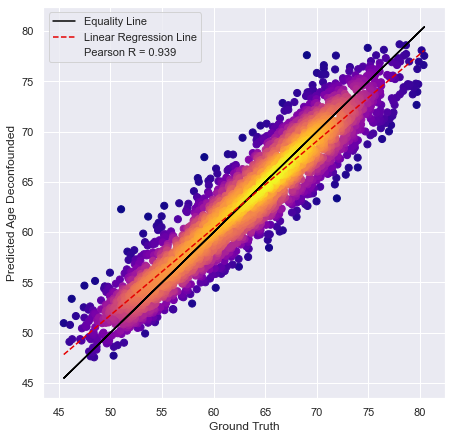

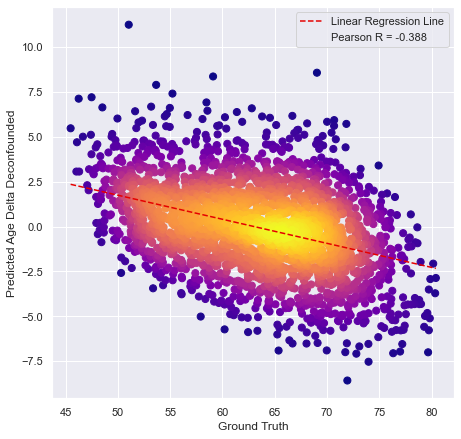

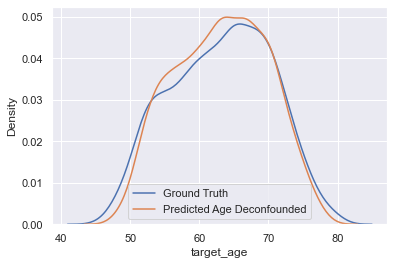

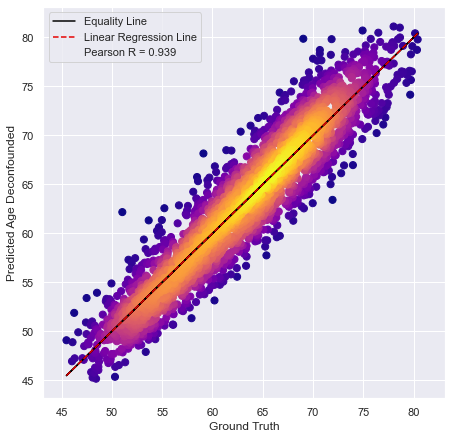

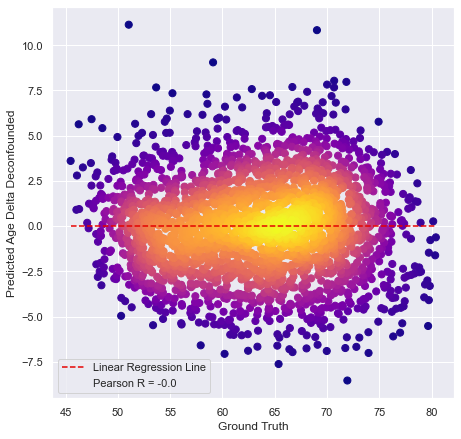

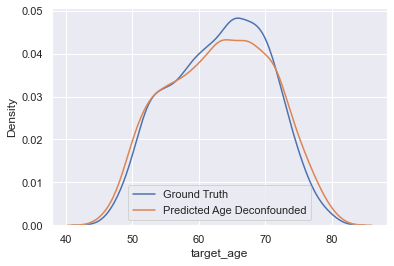

In [27]:
Yhat = lr.predict(Xtest)

deconfound = True
verbose = True
show_plots = True

Age_Deltas = Yhat - Ytest

if deconfound == True:
    Yhat_decon = age_deconfounding(Yhat, Ytest)
    Age_Deltas_decon = Yhat_decon - Ytest
else:
    Yhat_decon = None
    Age_Deltas_decon = None
    
mae = np.abs(Age_Deltas).mean()
pr = pearsonr(Ytest, Yhat)[0]

if deconfound == True:
    mae_decon = np.abs(Age_Deltas_decon).mean()
    pr_decon = pearsonr(Ytest, Yhat_decon)[0]
else:
    mae_decon = None
    pr_decon = None

if verbose == True:
    print('MAE=', mae)
    print('PR=', pr)
#     print('Time To Complete: {}'.format(end_time - start_time))
    if deconfound == True:
        print('MAE Decon=', mae_decon)
        print('PR Decon=', pr_decon)

if show_plots == True:
    scatter_plot_heatmap(x=Ytest, y=Yhat, xlabel='Ground Truth', 
                           ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

    scatter_plot_heatmap(x=Ytest, y=Age_Deltas, xlabel='Ground Truth', 
                           ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                           equality_line=False)

    kde_plot(x=Ytest, y=Yhat, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)

    if deconfound == True:
        scatter_plot_heatmap(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

        scatter_plot_heatmap(x=Ytest, y=Age_Deltas_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                               equality_line=False)

        kde_plot(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)          

MAE= 2.3389273748979758
PR= 0.9149685431954242
MAE Decon= 2.5663683678534466
PR Decon= 0.9149685431954243


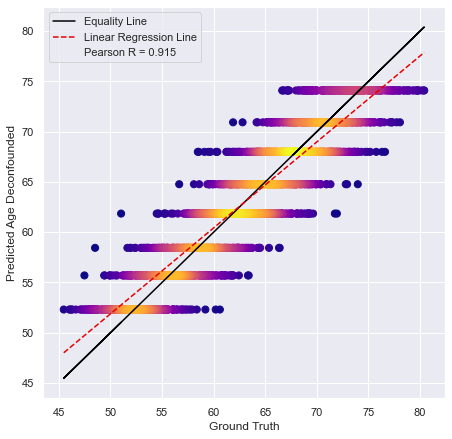

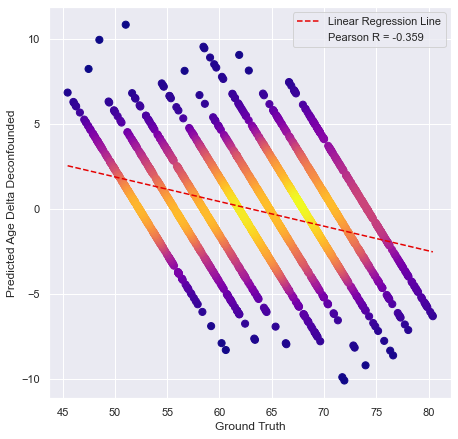

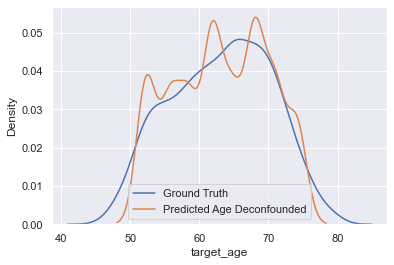

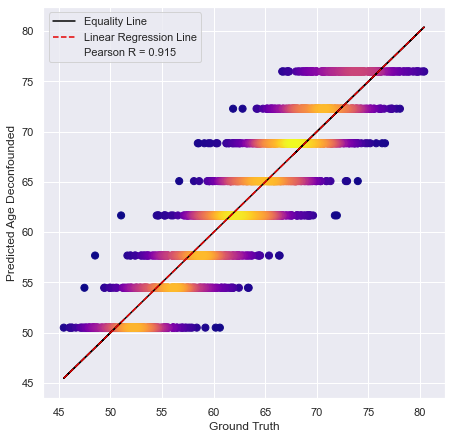

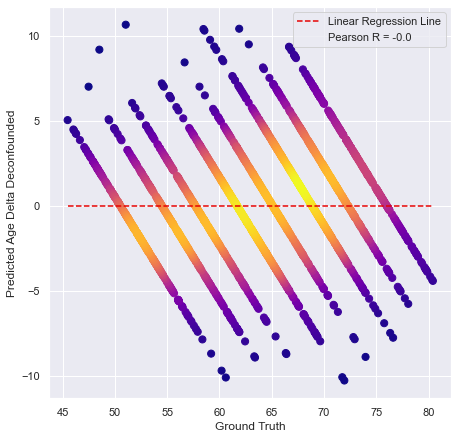

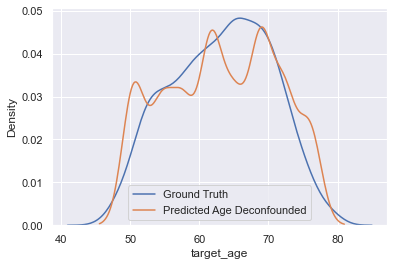

In [28]:
Yhat = rt.predict(Xtest)

deconfound = True
verbose = True
show_plots = True

Age_Deltas = Yhat - Ytest

if deconfound == True:
    Yhat_decon = age_deconfounding(Yhat, Ytest)
    Age_Deltas_decon = Yhat_decon - Ytest
else:
    Yhat_decon = None
    Age_Deltas_decon = None
    
mae = np.abs(Age_Deltas).mean()
pr = pearsonr(Ytest, Yhat)[0]

if deconfound == True:
    mae_decon = np.abs(Age_Deltas_decon).mean()
    pr_decon = pearsonr(Ytest, Yhat_decon)[0]
else:
    mae_decon = None
    pr_decon = None

if verbose == True:
    print('MAE=', mae)
    print('PR=', pr)
#     print('Time To Complete: {}'.format(end_time - start_time))
    if deconfound == True:
        print('MAE Decon=', mae_decon)
        print('PR Decon=', pr_decon)

if show_plots == True:
    scatter_plot_heatmap(x=Ytest, y=Yhat, xlabel='Ground Truth', 
                           ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

    scatter_plot_heatmap(x=Ytest, y=Age_Deltas, xlabel='Ground Truth', 
                           ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                           equality_line=False)

    kde_plot(x=Ytest, y=Yhat, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)

    if deconfound == True:
        scatter_plot_heatmap(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

        scatter_plot_heatmap(x=Ytest, y=Age_Deltas_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                               equality_line=False)

        kde_plot(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)          

# Train a BlackBox Model

Runs PartialDependence on top of a given pipeline to try and tease out how it's making decisions, or how does it determine overall which features are important. 

Looking at specific feature plots, the dark blue line shows the main response. 

In [29]:
from sklearn.neural_network import MLPRegressor

In [30]:
regr = MLPRegressor(hidden_layer_sizes = (100, 100, 25), max_iter=10000, learning_rate='adaptive').fit(Xtrain, Ytrain)

In [31]:
from interpret.blackbox import PartialDependence
from interpret import show

In [32]:
pdp = PartialDependence(predict_fn = regr.predict, data=Xtrain)

In [33]:
pdp_global = pdp.explain_global()
show(pdp_global)

In [34]:
from sklearn.linear_model import ElasticNet

In [35]:
model = ElasticNet(alpha=0.14766659013829683, l1_ratio=1.0).fit(Xtrain, Ytrain)

pdp = PartialDependence(predict_fn = model.predict, data=Xtrain)
pdp_global = pdp.explain_global()
show(pdp_global)

# EBM for RENT

In [36]:
modalities = ['T1_nonlinear', 'T1_linear', 'jacobian', 'vbm', 'T2_nonlinear', 'swi',
       'tfmri_1', 'tfmri_2', 'tfmri_5', 'tfmri_c_1', 'tfmri_c_2', 'tfmri_c_5',
       'tracts', 'tbss_FA_s', 'tbss_ICVF_s', 'tbss_L1_s', 'tbss_L2_s',
       'tbss_L3_s', 'tbss_MD_s', 'tbss_MO_s', 'tbss_OD_s', 'tbss_FA',
       'tbss_ICVF', 'tbss_ISOVF', 'tbss_L1', 'tbss_L2', 'tbss_L3', 'tbss_MD',
       'tbss_MO', 'tbss_OD']

In [37]:
Xtrain2 = Xtrain[modalities]
Xtest2 = Xtest[modalities]

In [38]:
ebm = ExplainableBoostingRegressor()
ebm.fit(Xtrain2, Ytrain)

ExplainableBoostingRegressor(feature_names=['T1_nonlinear', 'T1_linear',
                                            'jacobian', 'vbm', 'T2_nonlinear',
                                            'swi', 'tfmri_1', 'tfmri_2',
                                            'tfmri_5', 'tfmri_c_1', 'tfmri_c_2',
                                            'tfmri_c_5', 'tracts', 'tbss_FA_s',
                                            'tbss_ICVF_s', 'tbss_L1_s',
                                            'tbss_L2_s', 'tbss_L3_s',
                                            'tbss_MD_s', 'tbss_MO_s',
                                            'tbss_OD_s', 'tbss_FA', 'tbss_ICVF',
                                            'tbss_ISOVF', 'tbss_L1', 'tbss_L2',
                                            'tbss_L3', 'tb...
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                   

In [39]:
ebm_perf = RegressionPerf(ebm.predict).explain_perf(Xtest2, Ytest, name='EBM')
show(ebm_perf)

MAE= 2.073505724350018
PR= 0.9339050083696708
MAE Decon= 2.2129185409483436
PR Decon= 0.9339050083696708


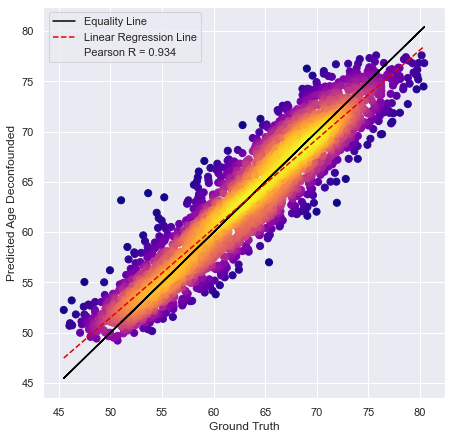

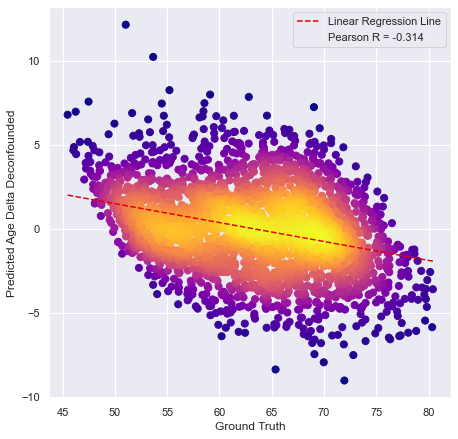

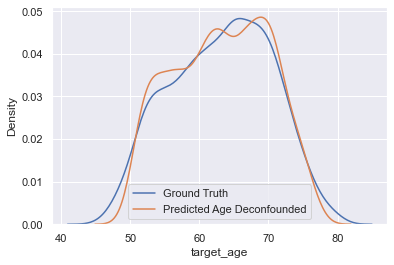

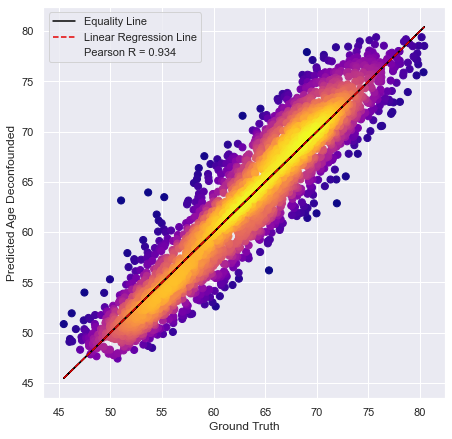

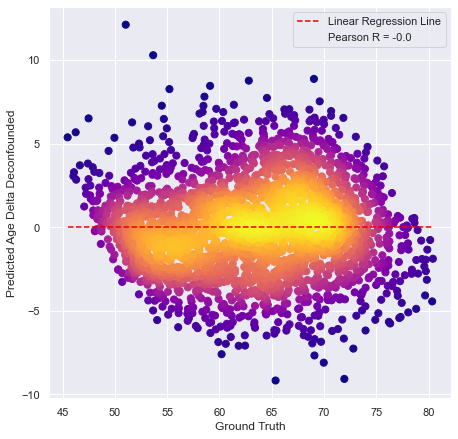

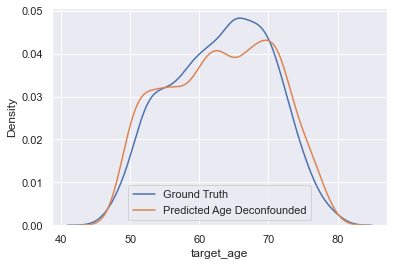

In [40]:
Yhat = ebm.predict(Xtest2)

deconfound = True
verbose = True
show_plots = True

Age_Deltas = Yhat - Ytest

if deconfound == True:
    Yhat_decon = age_deconfounding(Yhat, Ytest)
    Age_Deltas_decon = Yhat_decon - Ytest
else:
    Yhat_decon = None
    Age_Deltas_decon = None
    
mae = np.abs(Age_Deltas).mean()
pr = pearsonr(Ytest, Yhat)[0]

if deconfound == True:
    mae_decon = np.abs(Age_Deltas_decon).mean()
    pr_decon = pearsonr(Ytest, Yhat_decon)[0]
else:
    mae_decon = None
    pr_decon = None

if verbose == True:
    print('MAE=', mae)
    print('PR=', pr)
#     print('Time To Complete: {}'.format(end_time - start_time))
    if deconfound == True:
        print('MAE Decon=', mae_decon)
        print('PR Decon=', pr_decon)

if show_plots == True:
    scatter_plot_heatmap(x=Ytest, y=Yhat, xlabel='Ground Truth', 
                           ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

    scatter_plot_heatmap(x=Ytest, y=Age_Deltas, xlabel='Ground Truth', 
                           ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                           equality_line=False)

    kde_plot(x=Ytest, y=Yhat, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)

    if deconfound == True:
        scatter_plot_heatmap(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

        scatter_plot_heatmap(x=Ytest, y=Age_Deltas_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                               equality_line=False)

        kde_plot(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)          

In [41]:
ebm_global = ebm.explain_global(name='EBM')
show(ebm_global)

ebm_local = ebm.explain_local(Xtest2[:5], Ytest[:5], name='EBM')
print(Ytest[:5])
show(ebm_local)

4782    59.311073
1499    67.523907
1355    72.236872
428     69.261758
4145    48.488699
Name: target_age, dtype: float64


# Train Multiple EBMs

In [42]:
ebm1 = ExplainableBoostingRegressor().fit(Xtrain, Ytrain)
ebm2 = ExplainableBoostingRegressor().fit(Xtrain, Ytrain)
ebm3 = ExplainableBoostingRegressor().fit(Xtrain, Ytrain)
ebm4 = ExplainableBoostingRegressor().fit(Xtrain, Ytrain)
ebm5 = ExplainableBoostingRegressor().fit(Xtrain, Ytrain)

In [43]:
from interpret.glassbox.ebm.utils import *
from interpret import show

In [44]:
models = [ebm1, ebm2 , ebm3, ebm4, ebm5]
merged_ebm = merge_ebms(models=models)

NameError: name 'merge_ebms' is not defined